**Описание проекта**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места. Результаты оформить в виде презентации.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.


**Цель проекта** - изучить рынок общественного питания Москвы, найти интересные особенности и презентовать их. Дать рекомендации для открытия кофейни.

Ход исследования:
- Обзор и преобработка данных, полученных из сервисов Яндекс Карты и Яндекс Бизнес;
- Анализ данных по всем заведениям обещественного питания Москвы;
- Выводы и интересные особенности по результатам анализа;
- Детализация исследования для кофеен Москвы;
- Рекомендации для открытия кофейни.


### Обзор данных

In [1]:
#pip install folium

In [2]:
import pandas as pd
import scipy.stats as stats
import numpy as np
from numpy import median
import seaborn as sn
from matplotlib import pyplot as plt
import datetime as dt
from plotly import graph_objects as go
import plotly.express as px
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
#from IPython.display import display
#from pandas.plotting import register_matplotlib_converters
#register_matplotlib_converters()

In [3]:
#загружаем данные
data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
#функция для вывода основных методов при исследовании данных
def data_research(df):
    print('Вывод первых 5 строк датафрейма')
    print('*'*50)
    display(df.head())
    print('*'*50)
    print('Описание данных методом describe()')
    print('*'*50)
    display(df.describe())
    print('*'*50)
    print('Описание данных методом info()')
    print('*'*50)
    df.info()
    print('*'*50)
    print('Количество дубликатов')
    print('*'*50)
    print(df.duplicated().sum())

In [5]:
data_research(data)

Вывод первых 5 строк датафрейма
**************************************************


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


**************************************************
Описание данных методом describe()
**************************************************


,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


**************************************************
Описание данных методом info()
**************************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   

**Описание данных**

`name` — название заведения;

`address` — адрес заведения;

`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;

`hours` — информация о днях и часах работы;

`lat` — широта географической точки, в которой находится заведение;

`lng` — долгота географической точки, в которой находится заведение;

`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:

«Средний счёт: 1000–1500 ₽»;

«Цена чашки капучино: 130–220 ₽»;

«Цена бокала пива: 400–600 ₽».и так далее;

`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):

0 — заведение не является сетевым

1 — заведение является сетевым

`district` — административный район, в котором находится заведение, например Центральный административный округ;

`seats` — количество посадочных мест.

In [6]:
#изменим тип столбца seats на int
data['seats'] = data['seats'].astype('Int64')

In [7]:
#заменим в столбце 1 на сетевое, 0 - несетевое
data['chain'] = data['chain'].map({1:'сетевое', 0:'несетевое'})

In [8]:
#изменим тип столбца chain на строковый
data['chain'] = data['chain'].astype('str')

In [9]:
#сохраним исходный датафрейм для расчета количества удаленных данных
df = data

<div style="border:solid green 2px; padding: 20 px">
    
Явные дубликаты отсутствуют. Пропуски данных есть в столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats`. В `seats` максимальное количество посадочных мест - 1568, что довльно много, надо изучить столбец подробнее. Типы данных столбцов соответсвуют описанию, за исключением столбца `seats`, тип которого должен быть целочисленный. Тип столбца `chain` изменили на строковый для дальнейшего удобства построения графиков.

Проверим неявные дубликаты, приведем все значения в столбцах к нижнему регистру.
</div>

### Предобработка данных

In [10]:
#переведем названия к нижнему регистру
name_columns = list(data.columns.values)

for i, name in enumerate(name_columns):
    if name  in['name', 'address']:
        data[name] = data[name].str.lower()
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевое,<NA>
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,несетевое,4
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,несетевое,45
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,<NA>
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,сетевое,148


In [11]:
#проверим наличие неявных дубликатов по адресу и имени заведения
data.duplicated(subset=['name', 'address']).sum()

4

In [12]:
#выведем дубликаты
data[data.duplicated(subset=['name', 'address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,несетевое,<NA>
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,сетевое,188
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,сетевое,150
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,несетевое,276


In [13]:
data.query('name == "кафе" and address == "москва, парк ангарские пруды"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,несетевое,<NA>
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,несетевое,<NA>


In [14]:
#удалим дубликаты
data = data.drop_duplicates(subset=['name', 'address']).reset_index(drop=True)
print('строк после удаления дубликатов', len(data))
print('строк до удаления дубликатов', len(df))
print('процент удаленных строк: ', 100-(len(data)/len(df)*100))

строк после удаления дубликатов 8402
строк до удаления дубликатов 8406
процент удаленных строк:  0.0475850582917019


In [15]:
#Количество заведений в датафрейме
print('Количество заведений ',data['name'].nunique())

Количество заведений  5512


In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8402 entries, 0 to 8401
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   object 
 13  seats              4792 non-null   Int64  
dtypes: Int64(1), float64(5), object(8)
memory usage: 927.3+ KB


In [17]:
#проверим наличие пропусков в столбце middle_avg_bill при заполненном стобце avg_bill только для строк, начинающихся со "Средний счет"
searchfor = ['Средний']
data[(data['middle_avg_bill'].isna()) & (~(data['avg_bill'].isna())) & (data['avg_bill'].str.contains('Средний счёт',na=False))]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [18]:
#посчитаем количество строк, включающих фразу 'Средний счёт' 
data[data['avg_bill'].str.contains('Средний счёт',na=False)]['middle_avg_bill'].count()

3149

In [19]:
#посчитаем количество строк, включающих фразу 'капучино' 
data[data['avg_bill'].str.contains('капучино',na=False)]['middle_coffee_cup'].count()

535

In [20]:
#проверим наличие пропусков в столбце middle_avg_bill при заполненном стобце avg_bill только для строк, начинающихся со "Средний счет"
data[(data['middle_coffee_cup'].isna()) & (~(data['avg_bill'].isna())) & (data['avg_bill'].str.contains('капучино',na=False))]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


<div style="border:solid black 1px; padding: 20 px">
    
Таким образом, столбцы `middle_coffee_cup` и `middle_avg_bill` заполнены полностью (по имеющимся данным в столбце `avg_bill`). Дозаполнить столбцы `middle_coffee_cup` и `middle_avg_bill` средним или медианным значением будет не совсем корректно и повлияет на дальнейшие результаты исследования. По этой же причине заполнять стообец `seats` медианным или средним значением неправильно. 
Столбцы `price` и `hours`, вероятно, были получены по данным Яндекс Карт, а значит если столбцы остались не заполненными, то сведения о заведении отсутсвуют в сервисе. 

Поэтому все пропуски оставим без изменений.
</div>

In [21]:
#добавим столбец с названиями улиц, разбив строку по запятым и взяв второй элемент, соответсвующий улице
data['street'] = data['address'].apply(lambda x: x.split(', ')[1])
data[['address','street']].head()

,address,street
0,"москва, улица дыбенко, 7/1",улица дыбенко
1,"москва, улица дыбенко, 36, корп. 1",улица дыбенко
2,"москва, клязьминская улица, 15",клязьминская улица
3,"москва, улица маршала федоренко, 12",улица маршала федоренко
4,"москва, правобережная улица, 1б",правобережная улица


In [22]:
#Код ревьюера
data.query('street == "проспект мира"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
717,все лень,ресторан,"москва, проспект мира, 119, стр. 528",Северо-Восточный административный округ,"пн-чт 12:00–21:00; пт,сб 12:00–22:00; вс 12:00...",55.836107,37.614875,4.4,выше среднего,Средний счёт:от 1500 ₽,1500.0,NaN,несетевое,<NA>,проспект мира
785,старое место,кафе,"москва, проспект мира, 119, стр. 504",Северо-Восточный административный округ,"ежедневно, 11:00–22:00",55.837212,37.616469,4.1,средние,Средний счёт:900–1100 ₽,1000.0,NaN,несетевое,<NA>,проспект мира
791,doner one,кафе,"москва, проспект мира, 119, стр. 596",Северо-Восточный административный округ,"ежедневно, 11:00–21:00",55.839037,37.613027,4.2,NaN,NaN,NaN,NaN,несетевое,<NA>,проспект мира
799,пян-се,быстрое питание,"москва, проспект мира, 119, стр. 27",Северо-Восточный административный округ,"ежедневно, 10:00–20:00",55.834563,37.613549,4.4,NaN,NaN,NaN,NaN,сетевое,<NA>,проспект мира
908,космос,кафе,"москва, проспект мира, 119, стр. 34",Северо-Восточный административный округ,вт-вс 10:45–21:00,55.835060,37.622033,3.8,NaN,NaN,NaN,NaN,несетевое,<NA>,проспект мира
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2565,ice embassy,кафе,"москва, проспект мира, 26, стр. 2",Центральный административный округ,"ежедневно, круглосуточно",55.777311,37.636400,4.4,NaN,NaN,NaN,NaN,несетевое,273,проспект мира
2568,"халва, сеть почтоматов",кафе,"москва, проспект мира, 146",Северо-Восточный административный округ,пн-пт 10:00–19:00,55.820575,37.641970,3.6,NaN,NaN,NaN,NaN,несетевое,18,проспект мира
2569,ресторан,ресторан,"москва, проспект мира, 62, стр. 1",Центральный административный округ,NaN,55.785618,37.635511,4.3,NaN,NaN,NaN,NaN,несетевое,200,проспект мира
4778,food embassy,ресторан,"москва, проспект мира, 26, стр. 2",Центральный административный округ,"ежедневно, 10:00–00:00",55.777224,37.636288,4.5,высокие,Средний счёт:2500–3000 ₽,2750.0,NaN,несетевое,273,проспект мира


In [23]:
#добавим столбец с информацией о круглосуточном режиме работы заведений
data['is_24/7'] = data['hours'].str.contains('круглосуточно')
data[['hours','is_24/7']].head(11)

,hours,is_24/7
0,"ежедневно, 10:00–22:00",False
1,"ежедневно, 10:00–22:00",False
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False
3,"ежедневно, 09:00–22:00",False
4,"ежедневно, 10:00–22:00",False
5,"ежедневно, 10:00–23:00",False
6,пн 15:00–04:00; вт-вс 15:00–05:00,False
7,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",False
8,"ежедневно, 10:00–22:00",False
9,"ежедневно, 12:00–00:00",False


<div style="border:solid green 2px; padding: 20 px">
    
Датафрейм содержит 8406 строк и 5512 уникальных заведений.

В результате предобработки данных удалены 4 строки, являющиеся дубликатами, что соствляет 0,05%. Тип данных столбца `seats` изменен на целочисленный, а столбца `chain` на булевый.
Добавлены столбцы `is_24/7` и `street`, содержащие информацию о круглосуточной и ежедневной работе заведения и его улицу.
Заполнять пропуски в столбцах `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats` медианным или средним значением не стали, так как это отразится на дальнейшем результате анализа.
</div>

### Анализ данных

- Исследуем количество объектов общественного питания по категориям

In [24]:
#в данных представлены категории
print('В данных представлены категории', data['category'].unique())

В данных представлены категории ['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


In [25]:
data_by_category = data.groupby('category')['name'].count().sort_values(ascending=True).reset_index()
data_by_category.columns = ['category','count']
data_by_category['percent'] =  data_by_category['count']/data_by_category['count'].sum()

data_by_category

,category,count,percent
0,булочная,256,0.030469
1,столовая,315,0.037491
2,быстрое питание,603,0.071769
3,пиццерия,633,0.075339
4,"бар,паб",764,0.090931
5,кофейня,1413,0.168174
6,ресторан,2042,0.243037
7,кафе,2376,0.282790


In [26]:
fig = px.bar(data_by_category.assign(perc=lambda x: x["percent"].map('{:.0%}'.format)), x='count', y='category', text='perc', title='Распределение заведений общественного питания по категориям в Москве')
fig.update_layout(xaxis_title = 'Количество заведений', yaxis_title = 'Категория')
fig.show()

<div style="border:solid black 1px; padding: 20 px">
В данных представлены следующие категории: "кафе", "ресторан", "кофейня", "пиццерия", "бар,паб", "быстрое питание", "булочная", "столовая".
В топ-3 по количеству заведений входят "кафе", "ресторан" и "кофейня". Суммарная доля рынка данных категорий - 69%.
Реже всего в городе встречаются столовые и булочная (всего 3-4%).
</div>

- Исследуем количество посадочных мест в местах по категориям

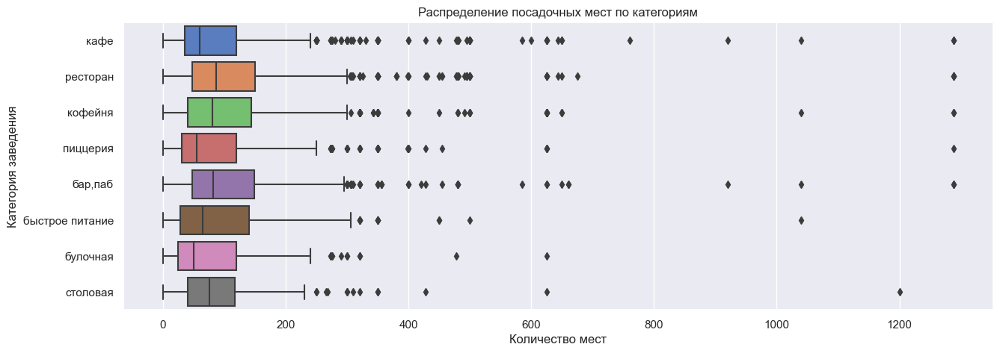

In [27]:
#вспомним о наличии большого количества посадочных мест для некоторых заведений, изучим данные на boxplot
plt.figure(figsize=(15,5))
sn.set(font_scale= 1)
sn.set_palette("muted")
ax = sn.boxplot(y='category', x='seats', data=data)
plt.title('Распределение посадочных мест по категориям')
plt.xlabel('Количество мест')
plt.ylabel('Категория заведения')
#plt.legend(bbox_to_anchor=(1.02 , 1), loc='upper left', borderaxespad= 0)
#plt.xticks(rotation = 30)
plt.show()

In [28]:
#посчитаем 90-й, 95-й и 99-й перцентили посадочных мест
data_seats = data[~data['seats'].isna()]
np.percentile(data_seats['seats'],[90,95,99])

array([240.0, 307.0, 625.0], dtype=object)

In [29]:
#заведения с 0 посадочных мест
data[data['seats']==0]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
84,meat doner kebab,булочная,"москва, улица лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,NaN,Средний счёт:300 ₽,300.0,NaN,несетевое,0,улица лескова,True
177,арамье,булочная,"москва, улица 800-летия москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,NaN,NaN,NaN,NaN,сетевое,0,улица 800-летия москвы,False
196,донер-шашлык,ресторан,"москва, улица лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896962,37.608300,4.5,NaN,NaN,NaN,NaN,несетевое,0,улица лескова,True
203,тандыр № 1,кафе,"москва, улица лескова, 22г",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.895615,37.611049,4.0,NaN,NaN,NaN,NaN,сетевое,0,улица лескова,True
211,неаполитан пицца,кафе,"москва, улица пришвина, 23",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.885416,37.604650,4.3,NaN,NaN,NaN,NaN,несетевое,0,улица пришвина,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8114,бико,булочная,"москва, улица симоновский вал, 13, стр. 3",Юго-Восточный административный округ,"ежедневно, 08:00–20:00",55.723340,37.664252,1.3,NaN,NaN,NaN,NaN,несетевое,0,улица симоновский вал,False
8164,чайхана уч кудук,кофейня,"москва, улица симоновский вал, 26, корп. 1",Южный административный округ,"ежедневно, 09:00–00:00",55.718663,37.662887,4.3,NaN,NaN,NaN,NaN,несетевое,0,улица симоновский вал,False
8168,масса кофе,кофейня,"москва, холодильный переулок, 2",Южный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–20:00",55.709713,37.624388,4.3,средние,Цена чашки капучино:100–210 ₽,NaN,155.0,несетевое,0,холодильный переулок,False
8332,сочная шаурма в кузьминках,быстрое питание,"москва, волгоградский проспект, 102",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.703834,37.773831,3.9,NaN,Средний счёт:120–130 ₽,125.0,NaN,несетевое,0,волгоградский проспект,True


Исключим из рассмотрения заведения с количеством посадочных мест больше 600. Заведения, где посадочные места отсутсвуют, исключать не будем.

In [30]:
#заменим na на заглушку -1 для столбца seats
data['seats'].fillna(-1,inplace=True)
#отфильтруем данные
data = data.query('seats<600')
print(f'На фильтрации потеряли {round(100-(len(data)/len(df)*100),2)}% данных')

На фильтрации потеряли 0.69% данных


In [31]:
result = data[data['seats']!=-1].groupby(['category'])['seats'].median().reset_index().sort_values('seats', ascending=False)
result

,category,seats
6,ресторан,86.0
0,"бар,паб",80.0
4,кофейня,78.0
7,столовая,75.0
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,52.0
1,булочная,50.0


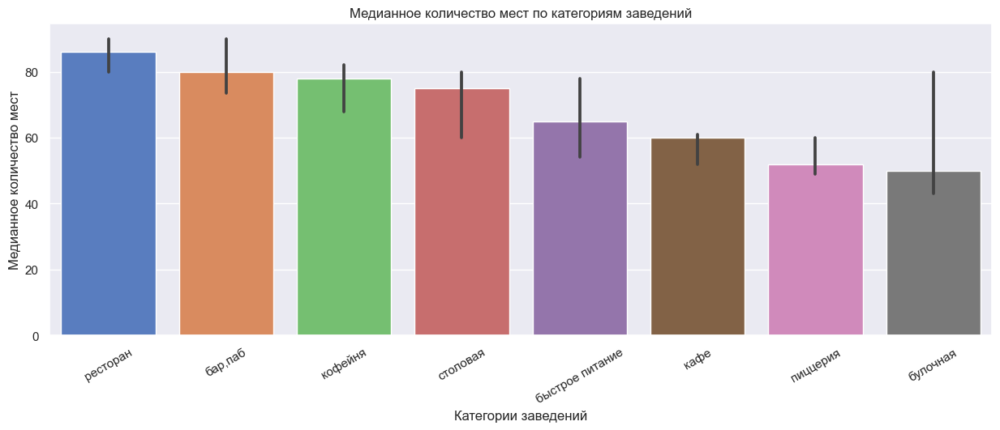

In [32]:
plt.figure(figsize=(15,5))
ax = sn.barplot(x='category', y='seats', data=data[data['seats']!=-1], estimator=median, order=result.category) 
plt.title('Медианное количество мест по категориям заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Медианное количество мест')
plt.xticks(rotation = 30)
plt.show()

In [33]:
result = data[data['seats']!=-1].groupby(['category'])['seats'].mean().reset_index().sort_values('seats', ascending=False)
result

,category,seats
6,ресторан,114.904535
0,"бар,паб",109.989083
4,кофейня,100.433018
2,быстрое питание,96.186782
3,кафе,89.828904
7,столовая,89.716049
5,пиццерия,87.91253
1,булочная,85.741497


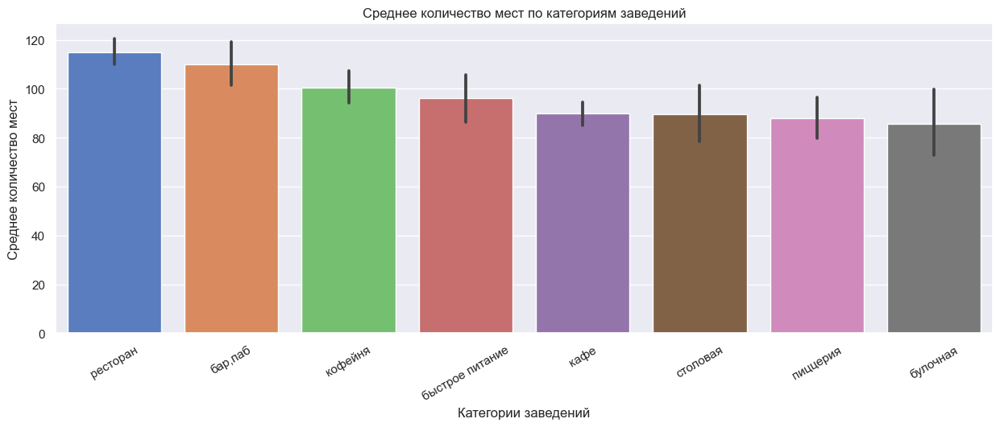

In [34]:
plt.figure(figsize=(15,5))
ax = sn.barplot(x='category', y='seats', data=data[data['seats']!=-1], order=result.category) 
plt.title('Среднее количество мест по категориям заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Среднее количество мест')
plt.xticks(rotation = 30)
plt.show()

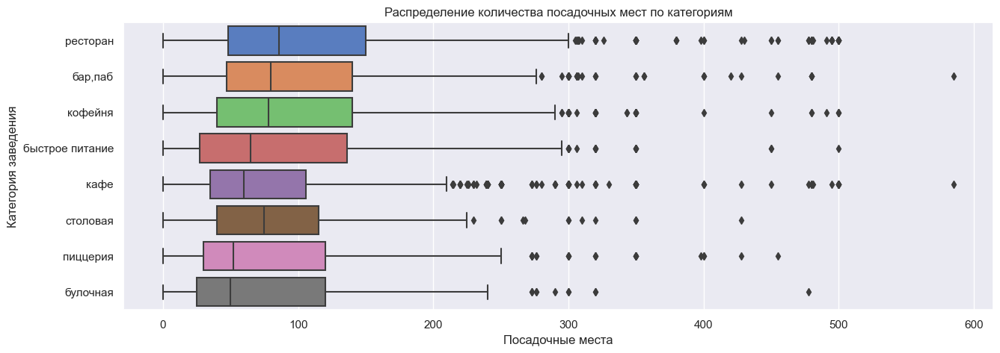

In [35]:
plt.figure(figsize=(15, 5))
ax = sn.boxplot(data=data[data['seats']!=-1], x='seats', y='category', order = result.category)
plt.title('Распределение количества посадочных мест по категориям')
plt.xlabel('Посадочные места')
plt.ylabel('Категория заведения')
plt.show()

<div style="border:solid black 1px; padding: 20 px">
Наибольшее количество посадочных мест имеют рестораны - 115, бары/пабы - 110 и кофейни - 100 и рестораны быстрого питания - 96. Все категории имеют достаточно большое количество выбросов (в особенности рестораны и быстрое питание). Действтельно, для каждого заведения свое оптимальное количество посадочных мест: кто-то нацелен на проведение больших торжеств, а кто-то на обслуживание среднего потока клиентов.  
</div>

- Какие категории заведений чаще являются сетевыми? 

In [36]:
#посчитаем количество сетевых и несетевых заведений
data_chain = data.pivot_table(index='chain',values='name', aggfunc='count'). reset_index()
data_chain

,chain,name
0,несетевое,5171
1,сетевое,3177


In [37]:
chain = ['несетевое','сетевое']
values =  data_chain['name']
fig = go.Figure(data=[go.Pie(labels=chain, values=values)])
fig.update_layout(title='Распределение сетевых и несетевых заведений в Москве')
fig.show() 

In [38]:
#посчитаем количество сетевых и несетевых заведений по категориям
data_chain_category = data.groupby(['chain','category'],as_index=False).agg(count=('name','nunique'))
#data_chain_category = data_chain_category.sort_values(by='count', ascending=False)
data_chain_category

,chain,category,count
0,несетевое,"бар,паб",584
1,несетевое,булочная,97
2,несетевое,быстрое питание,328
3,несетевое,кафе,1390
4,несетевое,кофейня,670
5,несетевое,пиццерия,296
6,несетевое,ресторан,1270
7,несетевое,столовая,189
8,сетевое,"бар,паб",88
9,сетевое,булочная,41


In [39]:
#посчитаем суммарное количество заведений по категориям
category_total = data.groupby('category', as_index=False).agg(count=('name','nunique'))
#объединим таблицы, чтобы рассчитать процент заведений
data_chain_category = data_chain_category.merge(category_total, on='category',suffixes=('_category','_total'))
data_chain_category['percent'] = round(data_chain_category['count_category']/data_chain_category['count_total']*100,2)
data_chain_category

,chain,category,count_category,count_total,percent
0,несетевое,"бар,паб",584,671,87.03
1,сетевое,"бар,паб",88,671,13.11
2,несетевое,булочная,97,138,70.29
3,сетевое,булочная,41,138,29.71
4,несетевое,быстрое питание,328,441,74.38
5,сетевое,быстрое питание,117,441,26.53
6,несетевое,кафе,1390,1733,80.21
7,сетевое,кафе,352,1733,20.31
8,несетевое,кофейня,670,822,81.51
9,сетевое,кофейня,157,822,19.10


In [40]:
fig = px.bar(data_chain_category, x='category', y ='count_category', color='chain', text='percent')
fig.update_layout(title='Количество сетевых/несетевых заведений по категориям', xaxis_title='', yaxis_title='', xaxis={'categoryorder':'total descending'})
fig.show()

<div style="border:solid black 1px; padding: 20 px">
В Москве в большем количестве представлены несетевые заведения - 62%. В целом по всем категориям заведений видно, что количество несетевых заведений сильно больше, чем сетевых. Кафе: 1390 - не сеть, 352 - сеть; ресторан : 1270 - не сеть, 273 - сеть; кофейня: 670 - не сеть, 157 - сеть.
</div>

- Топ-15 популярных сетей в Москве

In [41]:
# найдем топ-15 популярных сетей в Москве
top_chain = (data.query('chain == "сетевое"').groupby('name', as_index=False).agg(count_object=('name', 'count'))
     .sort_values(by='count_object', ascending=False)
     .reset_index(drop=True)).head(15)
top_chain

,name,count_object
0,шоколадница,118
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,70
4,яндекс лавка,68
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,теремок,38


In [42]:
#группируем по имени и категории заведения, считаем количество заведений
data_by_category = data.groupby(['name', 'category'], as_index=False).agg(count_category=('name', 'count'))
#отбираем только заведения, которые попали в топ-15
top_name_by_category = data_by_category[data_by_category['name'].isin(top_chain['name'])] 
top_name_by_category

,name,category,count_category
352,cofefest,кафе,1
353,cofefest,кофейня,31
424,cofix,кофейня,65
1193,one price coffee,кофейня,71
1333,prime,кафе,1
1334,prime,ресторан,49
2210,буханка,булочная,25
2211,буханка,кафе,1
2212,буханка,кофейня,6
2665,додо пицца,пиццерия,74


In [43]:
#строим график
fig = px.bar(top_name_by_category, x='count_category', y='name', color='category', text='count_category')
fig.update_layout(
    title='Топ-15 популярных сетей в Москве',
    xaxis_title='Количество заведений',
    yaxis_title='Название сети',
    yaxis={'categoryorder': 'total ascending'})
fig.show()

<div style="border:solid black 1px; padding: 20 px">
В топ-15 популярных сетей попали заведения, которые действительно знакомы на слух. Начинает топ "Шоколадница", "Домино'c пицца", "Додо пицца", "One price coffee" и "Яндекс лавка", а замыкает "Му-му". В основном категории заведений популярных сетей следующие: кофейня, пиццерия, ресторан, кафе и булочная. Сетевые пиццерии и кофейни заняли почти полностью топ-6, а значит пользуются большей популярностью. Многие заведения из данного списка работают по франшизе ("Шоколадница", "Домино'c пицца", "Додо пицца", "One price coffee", "cofix").
</div>

- Отобразите общее количество заведений и количество заведений каждой категории по районам.

In [44]:
#сгруппируем данные по районам и категориям, посчитаем количество заведений
data_by_regions = data.groupby(by=['district', 'category'], as_index=False).agg(count_name=('name','count')).reset_index()
data_by_regions = data_by_regions.sort_values(by=['district', 'count_name'], ascending=False)
data_by_regions

,index,district,category,count_name
67,67,Южный административный округ,кафе,264
70,70,Южный административный округ,ресторан,201
68,68,Южный административный округ,кофейня,131
66,66,Южный административный округ,быстрое питание,85
69,69,Южный административный округ,пиццерия,73
...,...,...,...,...
5,5,Восточный административный округ,пиццерия,72
2,2,Восточный административный округ,быстрое питание,70
0,0,Восточный административный округ,"бар,паб",50
7,7,Восточный административный округ,столовая,40


In [45]:
print(f'Представлены следующие районы Москвы:{data_by_regions["district"].unique()}')

Представлены следующие районы Москвы:['Южный административный округ' 'Юго-Западный административный округ'
 'Юго-Восточный административный округ'
 'Центральный административный округ'
 'Северо-Западный административный округ'
 'Северо-Восточный административный округ'
 'Северный административный округ' 'Западный административный округ'
 'Восточный административный округ']


In [46]:
#отобразим распределение на графике
fig = px.bar(data_by_regions, x='count_name', y='district', color='category', text='count_name')
fig.update_layout(title='Распределение количества заведений каждой категории по районам Москвы', yaxis_title='Район', xaxis_title='Количество заведений', yaxis={'categoryorder': 'total ascending'})
fig.show()

<div style="border:solid black 1px; padding: 20 px">
В ЦАО наибольшее количество заведений по сравнению с остальными районами суммарно и по каждой категории в отдельности. Что вполне логично, ведь туристический поток в основном направляется в центральные районы города.
    
В остальных районах, за исключением Северо-Западного административного округа, наблюдается примерно одинаковое количество заведений. Причем в однинаковой пропорции распределены количество заведений по категориям в порядке убывания: кафе, ресторан, кофейня, быстрое питание, пиццерия, бар/паб, столовая, булочная.
</div>

- Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [47]:
#медианный рейтинг по категориям заведений
data_avg_rating = data.groupby('category', as_index=False).agg(avg_rating=('rating','median'))
data_avg_rating = data_avg_rating.sort_values(by='avg_rating', ascending=False)
data_avg_rating

,category,avg_rating
0,"бар,паб",4.4
1,булочная,4.3
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.3
2,быстрое питание,4.2
3,кафе,4.2


In [48]:
#средний рейтинг по категориям заведений
data_avg_rating = data.groupby('category', as_index=False).agg(avg_rating=('rating','mean')).round(2)
data_avg_rating = data_avg_rating.sort_values(by='avg_rating', ascending=False)
data_avg_rating

,category,avg_rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


In [49]:
fig = px.bar(data_avg_rating,
             x='avg_rating',
             y='category',
             text='avg_rating',
             color='category'
            )
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                  xaxis_title='Рейтинг',
                  yaxis_title='Категория заведения')
fig.update_xaxes(range=[4, 4.5])
fig.show()

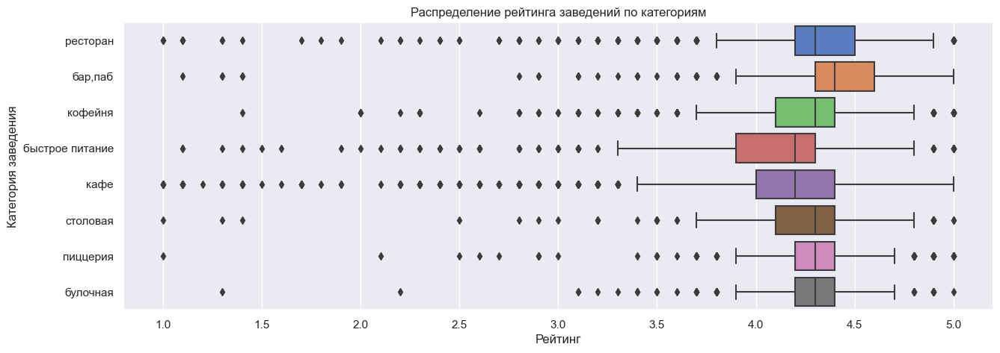

In [50]:
#боксплот для рейтинга заведений по категориям
plt.figure(figsize=(15, 5))
ax = sn.boxplot(data=data, x='rating', y='category', order = result.category)
plt.title('Распределение рейтинга заведений по категориям')
plt.xlabel('Рейтинг')
plt.ylabel('Категория заведения')
plt.show()

<div style="border:solid black 1px; padding: 20 px">
Наивысший рейтинг наблюдается у баров,пабов - 4.4. Приблизительно на одном уровне (~4.3) находится рейтинг булочных, кофеен, пиццерий, ресторанов и столовых. Заведения быстрого питания и кафе имеют самый низний рейтинг, вероятно потому что работабт по принципу высокой пропускной способности - больше людей - больше мнений. В целом можно сделать вывод, что рейтинги не сильно различают между категориями заведений от 4.0 до 4.4. 
</div>

- Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [51]:
#подготовим данные рейтинги по районам - медианное значение
rating_data = data.groupby(['district'], as_index=False).agg({'rating':'median'}).sort_values(by='rating', ascending=False)
rating_data

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


In [52]:
#подготовим данные рейтинги по районам - среднее значение
rating_data = data.groupby(['district'], as_index=False).agg({'rating':'mean'}).round(2).sort_values(by='rating', ascending=False)
rating_data

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [53]:
#загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

# moscow_lat - широта, moscow_lng – долгота
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBuGn',
    fill_opacity=0.6,
    legend_name='Средний рейтинг заведений по округам Москвы',
).add_to(m)

# выводим карту
m

<div style="border:solid black 1px; padding: 20 px">
В ЦАО заведения имеют наивысший рейтинг - 4.38. Остальные районы, за исключением СВАО и ЮВАО, имеют рейтинг ~4.2. 
В ЦАО сложно открыться "среднему" заведению из-за высоких цен на аренду (покупку недвижимости), поэтому много элитных/эксклюзивных заведений, благодаря чему рейтинг высокий.
</div>

- Все заведения датасета на карте

In [54]:
# подключаем библиотеку
from folium import Marker

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию для создания маркера ко всем строкам датафрейма
data.apply(create_clusters, axis=1)
    
# выводим карту
m

- Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам.

In [55]:
#ывберем топ-15 улиц по количеству заведений
top_street = data.groupby('street',as_index=False)['name'].count().sort_values(by='name', ascending=False)
top_street = top_street.head(15)
top_street_15 = top_street['street'].unique()
top_street_15

array(['проспект мира', 'профсоюзная улица', 'ленинский проспект',
       'проспект вернадского', 'дмитровское шоссе', 'каширское шоссе',
       'варшавское шоссе', 'ленинградский проспект',
       'ленинградское шоссе', 'мкад', 'люблинская улица',
       'улица вавилова', 'кутузовский проспект', 'пятницкая улица',
       'улица миклухо-маклая'], dtype=object)

In [56]:
#группируем по улице и категории заведения, считаем количество заведений
#отбираем только заведения, которые попали в топ-15
data_street = data.query('street in @top_street_15').groupby(['street', 'category'], as_index=False).agg(count_category=('name', 'count')) 
data_street = data_street.sort_values(by=['street','count_category'],ascending=False)
data_street

,street,category,count_category
107,улица миклухо-маклая,кафе,20
110,улица миклухо-маклая,ресторан,14
106,улица миклухо-маклая,быстрое питание,4
108,улица миклухо-маклая,кофейня,4
105,улица миклухо-маклая,"бар,паб",3
...,...,...,...
3,варшавское шоссе,кофейня,14
1,варшавское шоссе,быстрое питание,7
6,варшавское шоссе,столовая,7
0,варшавское шоссе,"бар,паб",6


In [57]:
#отобразим распределение на графике
fig = px.bar(data_street, x='count_category', y='street', color='category', text='count_category')
fig.update_layout(title='Распределение количества заведений каждой категории по топ-15 улицам Москвы', yaxis_title='Улица', xaxis_title='Количество заведений', yaxis={'categoryorder': 'total ascending'})
fig.show()

<div style="border:solid black 1px; padding: 20 px">
Больше всего заведений расположено на улице "Проспект Мира" (более 150 заведений), на втором месте "Профсоюзная улица", на третьем - "Ленинский проспект". Самые популярные категории заведений на улицах - кафе, ресторан и койфейня.
</div>

 - Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [58]:
#ывберем улицы с одним заведением
bottom_street = data.groupby('street',as_index=False)['name'].count().sort_values(by='name')
bottom_street = bottom_street[bottom_street['name']==1]
bottom_street = bottom_street['street'].unique()
bottom_street.shape[0]

457

In [59]:
data_bottom_street = data.query('street in @bottom_street').groupby('category', as_index=False).agg(count_category=('name','count'))
data_bottom_street = data_bottom_street.sort_values('count_category',ascending=False)
data_bottom_street

,category,count_category
3,кафе,159
6,ресторан,93
4,кофейня,84
0,"бар,паб",39
7,столовая,36
2,быстрое питание,23
5,пиццерия,15
1,булочная,8


<div style="border:solid black 1px; padding: 20 px">
Чаще всего на улицах с одним заведением встречается категория "кафе" - 159. В топ-3 также входит "ресторан" - 93 и "кофейня" - 84.
</div>

- Фоновая картограмма (хороплет) с значением среднего чека для каждого района

In [60]:
#подготовим данные со средним чеком по районам
data_avr_bill = data.groupby(['district'], as_index=False).agg({'middle_avg_bill':'median'}).sort_values(by='middle_avg_bill', ascending=False)
data_avr_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [61]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_avr_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuBuGn',
    fill_opacity=0.6,
    legend_name='Средний чек по округам Москвы',
).add_to(m)

# выводим карту
m

<div style="border:solid black 1px; padding: 20 px">
Самый высокий средний чек - 1000 руб - наблюдается в двух районах ЦАО и ЗАО, что логично, данные районы считаются одними из самых престижных. Хуже всего со средним чеком ситуация обстоит в СВАО, ЮАО, ЮВАО (500 руб, 500 руб и 450 соответсвенно).
</div>

- Режим работы заведений по топ-15 улицам Москвы

In [62]:
data_24 = data.query('street in @top_street_15').groupby(['street', 'is_24/7'], as_index=False).agg(count_category=('name', 'count')) 
data_24 = data_24.sort_values(by=['street','count_category'],ascending=False)
#data_24['is_24/7'] = data_24['is_24/7'].astype('str')
data_24

,street,is_24/7,count_category
28,улица миклухо-маклая,False,42
29,улица миклухо-маклая,True,2
26,улица вавилова,False,50
27,улица вавилова,True,2
24,пятницкая улица,False,45
25,пятницкая улица,True,3
22,профсоюзная улица,False,101
23,профсоюзная улица,True,14
20,проспект мира,False,170
21,проспект мира,True,5


In [63]:
#отобразим распределение на графике
fig = px.bar(data_24, x='count_category', y='street', color='is_24/7', text='count_category')
fig.update_layout(title='Режим работы заведений по топ-15 улицам Москвы', yaxis_title='Улица', xaxis_title='Количество заведений', yaxis={'categoryorder': 'total ascending'})
fig.show()

<div style="border:solid black 1px; padding: 20 px">
В целом заведений с крулосуточной работой на топ-15 улицах Москвы мало. Но выделяется "Люблинская улица", "Профсоюзная улица" и "МКАД".
</div>

In [64]:
data_24 = data.query('street in @top_street_15').groupby(['category', 'is_24/7'], as_index=False).agg(count_category=('name', 'count')) 
data_24 = data_24.sort_values(by=['category','count_category'],ascending=False)
#data_24['is_24/7'] = data_24['is_24/7'].astype('str')
data_24

,category,is_24/7,count_category
14,столовая,False,32
15,столовая,True,4
12,ресторан,False,291
13,ресторан,True,18
10,пиццерия,False,76
11,пиццерия,True,3
8,кофейня,False,192
9,кофейня,True,16
6,кафе,False,249
7,кафе,True,41


In [65]:
#отобразим распределение на графике
fig = px.bar(data_24, x='count_category', y='category', color='is_24/7', text='count_category')
fig.update_layout(title='Заведения по режиму работы на топ-15 улицах Москвы', yaxis_title='Улица', xaxis_title='Количество заведений', yaxis={'categoryorder': 'total ascending'})
fig.show()

<div style="border:solid black 1px; padding: 20 px">
Круглосуточный режим работы чаще имеют следующие заведения: кафе, ресторан и ресторан быстрого питания.
</div>

<div style="border:solid green 2px; padding: 20 px">
    
**Вывод по разделу**
    
В результате анализа заведений общественного питания Москвы выявили:
    
- Чаще всего в Москве открывают "кафе" - 2376 заведений, "ресторан" - 2042 и "кофейню" - 1413. Суммарная доля рынка данных категорий - 69%.Реже всего в городе встречаются столовые и булочная (всего 3-4% заведений).

- Наибольшее количество посадочных мест имеют рестораны - 115, что вполне логично, так как в ресторанах чаще всего происходит празднование событий. Следом идут бары,пабы - 110, кофейни - 100 и рестораны быстрого питания - 96.
Наименьшее количество посадочных мест имеют булочные и пиццерии.

- 62% заведений в Москве являются несетевыми. Наибольшая доля сетевых заведений в следующих категориях:
    
    булочная - 30% сетевых заведений
    
    быстрое питание - 27% сетевых заведений
    
    кафе - 20% сетевых заведений.

    
- Самая популярная сеть - "Шоколадница" с 118 заведениями в Москве. Второеи и третье место у - "Доминос пицца" и "Додо пицца". Данные сетевые заведения работают по франшизе, чем и может объясняться их лидирующее положение.

- Всего представлено 9 административных округов. В ЦАО наибольшее количество заведений (2242) по сравнению с остальными районами суммарно и по каждой категории в отдельности. Что вполне логично, ведь туристический поток в основном направляется в центральные районы города.
    В остальных районах, за исключением Северо-Западного административного округа (меньше 500 заведений), наблюдается примерно одинаковое количество заведений (от 891 до 702). Причем везде лидирующие категории в порядке убывания: кафе, ресторан, кофейня. Булочных и столовых в каждом районе представлено меньше всего.

- Наивысшим рейтингом обладает категория заведения "бар, паб" - 4.39. Следом идут примерно на одном уровне "пиццерии" - 4.3, "рестораны" - 4.29, "кафе" - 4.28, "булочные" - 4.27, "столовая" - 4.21. Низкий рейтинг наблюдается у "ресторанов быстрого питания" - 4.05 и "кафе" - 4.12. В целом рейтинг каждой категории находится выше 4.0, и различается только на десятые доли.

- По округам Москвы: самый высокий средний рейтинг у заведений в ЦАО. В остальных районах за исключением СВАО (4.15) и ЮВАО (4.10), примерно ~4.2.

- Самые популярные улицы по количеству заведений - Проспект мира, Профсоюзная улица и  Ленинский проспект. Преобладают категории заведений: кафе, рестораны и кофейни.
    
- На 457 улицах расположено только одно заведение, чаще всего это кафе - 159.
    
- Самый высокий средний чек в ЦАО и ЗАО - 1000 руб, так как эти районы считают престижными. Вероятно, высокая цена на аренду (покупку) недвижимости в большей степени позволяет открывать только эксклюзивные/дорогие заведения. Самый низкий чек СВАО, ЮАО, ЮВАО (500 руб, 500 руб и 450 соответственно).
    
- Заведений с круглосуточной работой на топ-15 улицах Москвы мало. Но выделяется "Люблинская улица", "Профсоюзная улица" и "МКАД". Круглосуточный режим работы чаще имеют следующие заведения: кафе, ресторан и ресторан быстрого питания.

</div>

### Детализируем исследование

- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [66]:
data_coffee = data.query('category=="кофейня"')
print(f'Всего кофеен в датасете {data_coffee.shape[0]}')

Всего кофеен в датасете 1401


In [67]:
#создаем карту
c = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
#создаем пустой кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(c)
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

#применяем функцию create_clusters() к каждой строке датафрейма
data_coffee.apply(create_clusters, axis=1)

#выводим карту
c

In [68]:
#кофейни по районам Москвы
coffee_district = data_coffee.groupby('district', as_index=False).agg(count_object=('name','count')).sort_values(by='count_object',ascending=False)
coffee_district['perc'] = round(coffee_district['count_object']/coffee_district['count_object'].sum()*100,2)
coffee_district

,district,count_object,perc
5,Центральный административный округ,428,30.55
2,Северный административный округ,186,13.28
3,Северо-Восточный административный округ,159,11.35
1,Западный административный округ,146,10.42
8,Южный административный округ,131,9.35
0,Восточный административный округ,104,7.42
7,Юго-Западный административный округ,96,6.85
6,Юго-Восточный административный округ,89,6.35
4,Северо-Западный административный округ,62,4.43


In [69]:
#отобразим распределение на графике
fig = px.bar(coffee_district, x='count_object', y='district', text='count_object')
fig.update_layout(title='Количество кофеен по округам Москвы', yaxis_title='Округ', xaxis_title='Количество заведений', yaxis={'categoryorder': 'total ascending'})
fig.show()

<div style="border:solid black 1px; padding: 20 px">
Всего кофеен в датасете 1401. Причем 428 (30,5%) из них расположены в ЦАО - абсолютный лидер по кофейням. Меньше всего расположено кофеен в СЗАО - 62 (4,4%).
</div>

In [70]:
#проверим круглосуточные кофейни
unlimited_coffee = data_coffee[data_coffee['is_24/7']==True]
print(f'Круглосуточных кофеен {data_coffee[data_coffee["is_24/7"]==True].shape[0]}')

Круглосуточных кофеен 76


In [71]:
#районы расположения круглосуточных кофеен
unlimited_coffee_district = unlimited_coffee.groupby('district', as_index=False).agg(count_coffee=('name','count')).sort_values('count_coffee',ascending=False)
unlimited_coffee_district

,district,count_coffee
5,Центральный административный округ,38
1,Западный административный округ,11
7,Юго-Западный административный округ,7
2,Северный административный округ,6
0,Восточный административный округ,5
3,Северо-Восточный административный округ,4
4,Северо-Западный административный округ,3
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [72]:
#отобразим распределение на графике
fig = px.bar(unlimited_coffee_district, x='count_coffee', y='district', text='count_coffee')
fig.update_layout(title='Количество круглосуточных кофеен по округам Москвы', yaxis_title='Округ', xaxis_title='Количество круглосуточных заведений', yaxis={'categoryorder': 'total ascending'})
fig.show()

In [73]:
#создаем карту
coffee = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
#создаем пустой кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(coffee)

#применяем функцию create_clusters() к каждой строке датафрейма
unlimited_coffee.apply(create_clusters, axis=1)

#выводим карту
coffee

<div style="border:solid black 1px; padding: 20 px">
Большая часть круглосуточных кофеен расположена в ЦАО - 38 и ЗАО - 11. В остальных районах от 7 до 1 кофейни. ЦАО и ЗАО - исторические районы, по которым гуляют приезжие и жители города, поэтому наличие круглосуточных кофеен логично.
</div>

In [74]:
#рейтинги кофеен по округам
rating_coffee = data_coffee.groupby('district', as_index=False).agg(avr_rating=('rating','mean')).round(2).sort_values('avr_rating',ascending=False)
rating_coffee

,district,avr_rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [75]:
# создаём карту Москвы
c = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_coffee,
    columns=['district', 'avr_rating'],
    key_on='feature.name',
    fill_color='PuBuGn',
    fill_opacity=0.6,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(c)

# выводим карту
c

<div style="border:solid black 1px; padding: 20 px">
Самый высокий рейтинг кофеен в ЦАО - 4.34 и СЗАО - 4.33. Самый низний рейтинг в ЗАО - 4.19.
</div>

In [76]:
#На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
coffee_cup = data_coffee.groupby('district', as_index=False).agg(coffee_cup_bill=('middle_coffee_cup','mean')).round(2).sort_values('coffee_cup_bill', ascending=False)
coffee_cup

,district,coffee_cup_bill
1,Западный административный округ,188.56
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,166.34
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


In [77]:
print(f'Средняя стоимость чашки кофе в Москве:{round(coffee_cup["coffee_cup_bill"].mean(),2)}')

Средняя стоимость чашки кофе в Москве:171.23


In [78]:
# создаём карту Москвы
cb = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_cup,
    columns=['district', 'coffee_cup_bill'],
    key_on='feature.name',
    fill_color='PuBuGn',
    fill_opacity=0.6,
    legend_name='Средний стоимость чашки капучино по районам Москвы',
).add_to(cb)

# выводим карту
cb

<div style="border:solid black 1px; padding: 20 px">
Самая высокая стоимость чашки капучино в ЦАО - 187.52 руб и ЗАО - 188.56 руб. Дешевле всего чашка кофе обойдется в ЮВАО - 151.09 руб.
</div>

In [79]:
#посмотрим на распределение сетевых и несетевых кофеен по округам
data_coffee_chain = data_coffee.groupby(['district','chain'], as_index=False).agg(count_coffee=('name','count')).sort_values('count_coffee',ascending=False)
data_coffee_chain

,district,chain,count_coffee
11,Центральный административный округ,сетевое,221
10,Центральный административный округ,несетевое,207
4,Северный административный округ,несетевое,93
5,Северный административный округ,сетевое,93
3,Западный административный округ,сетевое,91
6,Северо-Восточный административный округ,несетевое,80
7,Северо-Восточный административный округ,сетевое,79
17,Южный административный округ,сетевое,66
16,Южный административный округ,несетевое,65
12,Юго-Восточный административный округ,несетевое,60


In [80]:
fig = px.bar(data_coffee_chain, x='district', y ='count_coffee', color='chain', text='count_coffee')
fig.update_layout(title='Количество сетевых/несетевых кофеен', xaxis_title='', yaxis_title='', xaxis={'categoryorder':'total descending'})
fig.show()

In [81]:
#самые популярные сетевые кофейни по округам
top_chain_coffee = data_coffee.query('chain=="сетевое"').groupby('name', as_index=False).agg(count_coffee=('name','count')).sort_values('count_coffee',ascending=False)
top_chain_coffee.head(10)

,name,count_coffee
155,шоколадница,117
59,one price coffee,70
32,cofix,65
116,кофепорт,42
13,cofefest,31
115,кофемания,22
12,cinnabon,20
136,правда кофе,13
52,krispy kreme,9
77,wild bean cafe,8


In [82]:
top_8 = top_chain_coffee['name'].head(8)
top_8

155         шоколадница
59     one price coffee
32                cofix
116            кофепорт
13             cofefest
115           кофемания
12             cinnabon
136         правда кофе
Name: name, dtype: object

In [83]:
#самые популярные сетевые кофейни по округам
chain_object = data_coffee.query('chain=="сетевое" and name in @top_8').groupby(['district','name'], as_index=False).agg(count_coffee=('name','count')).sort_values('count_coffee',ascending=False)
chain_object.head(10)

,district,name,count_coffee
43,Центральный административный округ,шоколадница,38
38,Центральный административный округ,cofix,20
13,Западный административный округ,шоколадница,16
39,Центральный административный округ,one price coffee,15
41,Центральный административный округ,кофепорт,15
40,Центральный административный округ,кофемания,14
21,Северный административный округ,шоколадница,13
61,Южный административный округ,шоколадница,12
28,Северо-Восточный административный округ,шоколадница,11
6,Восточный административный округ,шоколадница,11


In [84]:
fig = px.bar(chain_object, x='district', y ='count_coffee', color='name', text='count_coffee')
fig.update_layout(title='Количество сетевых кофеен по округам', xaxis_title='', yaxis_title='', xaxis={'categoryorder':'total descending'})
fig.show()

<div style="border:solid black 1px; padding: 20 px">

**Вывод**
    
Всего кофеен в датасете 1401. 
    
- Рекордсмен по кофейням ЦАО - 30,5% всех заведений расположено именно там. Вероятно, такое количество заведений обусловлено особенностью района -  некий "туристический и рабочий центр". В будние дни значительное скопление людей в данном округе связано с наличием большого количества рабочих мест. В выходные улицы заполняют туристы и гуляющие москвичи за счёт общепринятых мест отдыха/притяжений.
Поэтому вариант открыть кофейню в ЦАО имеет право на жизнь, но будьте готовы к высокой конкуренции Стоимость чашки кофе в ЦАО одна из самых высоких, что может быть обусловлено как и высокими ценами на аренду помещений, так и из-за большого количества людей с разным уровнем дохода -> более высокая маржинальность.
- Меньше всего расположено кофеен в СЗАО - 62 (4,4%). Вероятно, это связано с тем, что данный район один из самых маленьких в Москве, количество станций метро тоже не так велико по сравнению с другими районами. Кофейни привычно открываются недалеко от станций метро, так как основной пассажиропоток проходит именно там. В целом не стоит ставить крест на СЗАО, при низкой конкуренции и правильном выборе места размещении кофейни бизнес может стать удачным (хорошо бы триггер типа института или БЦ рядом). Но цена чашки кофе в СЗАО  близка к минимальной по Москве.

    
- При открытии круглосуточной кофейни стоит рассматривать только ЦАО, так как остальные районы либо спальные, либо не имеют такого потока людей в ночное время.

- В целом видно, что сетевые кофейни встречаются также часто, как и несетевые, за исключением ЮВАО (сеть - 29, не сеть - 60).Стоит рассмотреть вариант открыть кофейню по франшизе, так не придется работать над узнаваемостью вашего бренда. В ЮВАО расположено мало сетевых заведений, поэтому конкуренция будет ниже.
- Из крупных сетевых кофеен в ЮВАО имеется 6 точек "One price coffee", остальные бренды представлены в количестве 2 и меньше. Так как "Шоколадница", "Coffix", "Cofest" и "Кофепорт" - входят в топ-15 популярных заведений Москвы, то предлагается открыть кофейню по их франшизе.
- ЮЗАО также район с наименьшим количеством кофеен, имеет 7 точек "Шоколадницы" и 7 - "One price coffee". Остальные франшизы представлены в меньшем количестве. Рекомендация: открыть "Coffix", "Cofest" и "Кофепорт" по франшизе.
    
</div>

**Презентация:** <https://disk.yandex.ru/i/57j-XUMAtXi_ug> 